# Exploring the results (original version)

Importing libraries

In [39]:
from nilearn import plotting
from glob import glob
import numpy as np
import sys
import pandas as pd
import matplotlib
from nistats.thresholding import map_threshold
from matplotlib import pyplot as plt
from IPython.display import display_html
sys.path.append('/home/grg/git/alfa/pyAAL')
sys.path.append('/home/grg/git/alfa/')
import multireg_spm12 as mreg
import pyAAL

%matplotlib inline
plt.rcParams.update({'figure.max_open_warning': 0})

Setting paths

In [40]:
spm = glob('/tmp/output/*/analysis/estimatecontrasts/SPM.mat')
aal_fp = '/usr/local/MATLAB/R2014a/toolbox/spm12/toolbox/aal/ROI_MNI_V5.nii'
mask_fp = '/home/grg/spm/MNI_T1_brain_mask.nii'
analysis_wd = '/tmp/output'
excel_fp = '/home/grg/spm/data/designmatrix2.xls'
paramtype = 'MD'

print 'Found SPM files:', spm

Found SPM files: ['/tmp/output/FA/analysis/estimatecontrasts/SPM.mat', '/tmp/output/L1/analysis/estimatecontrasts/SPM.mat', '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat', '/tmp/output/RD/analysis/estimatecontrasts/SPM.mat']


Actual contrasts defined in the analysis

In [41]:
print 'Reading', excel_fp, 'looking up column', paramtype, '...'
a = mreg.multiple_regression_analysis(paramtype, excel_fp, analysis_wd, mask_fp, verbose=False)
n1 = a.get_node('modeldesign')
n3 = a.get_node('estimatecontrasts')
print '# of scans included in the analysis:', len(n1.inputs.in_files)
display_html(pd.DataFrame([e for e in n3.inputs.contrasts], 
             columns=['contrast name', 'contrast type', 'covariate names', 'covariate weights']))

Reading /home/grg/spm/data/designmatrix2.xls looking up column MD ...
# of scans included in the analysis: 508


,contrast name,contrast type,covariate names,covariate weights
0,Apo2-3>Apo2-4,T,"[Apoe2-3, Apoe2-4]","[1.0, -1.0]"
1,Apo2-4>Apo3-3,T,"[Apoe2-4, Apoe3-3]","[1.0, -1.0]"
2,Apo3-3>Apo3-4,T,"[Apoe3-3, Apoe3-4]","[1.0, -1.0]"
3,Apo3-4>Apo4-4,T,"[Apoe3-4, Apoe4-4]","[1.0, -1.0]"
4,Main effect ApoE,F,"[(Apo2-3>Apo2-4, T, [Apoe2-3, Apoe2-4], [1.0, ...",None
5,C<NC,T,"[Apoe2-3, Apoe2-4, Apoe3-3, Apoe3-4, Apoe4-4]","[3.0, -2.0, 3.0, -2.0, -2.0]"
6,C>NC,T,"[Apoe2-3, Apoe2-4, Apoe3-3, Apoe3-4, Apoe4-4]","[-3.0, 2.0, -3.0, 2.0, 2.0]"
7,HO<HZ,T,"[Apoe2-3, Apoe2-4, Apoe3-3, Apoe3-4, Apoe4-4]","[1.0, 1.0, 1.0, 1.0, -4.0]"
8,HO>HZ,T,"[Apoe2-3, Apoe2-4, Apoe3-3, Apoe3-4, Apoe4-4]","[-1.0, -1.0, -1.0, -1.0, 4.0]"
9,HO<All_Age_Squared,T,"[agesq23, agesq24, agesq33, agesq34, agesq44]","[3.0, -2.0, 3.0, -2.0, -2.0]"


# Results from the analysis of Mean Diffusivity maps

/tmp/output/MD/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0011.nii


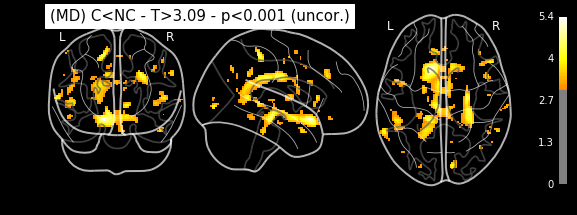

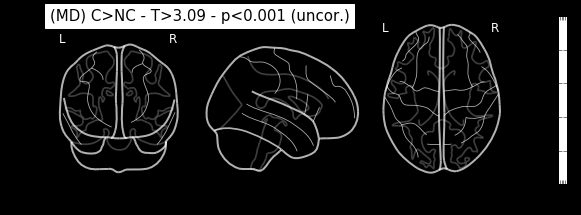

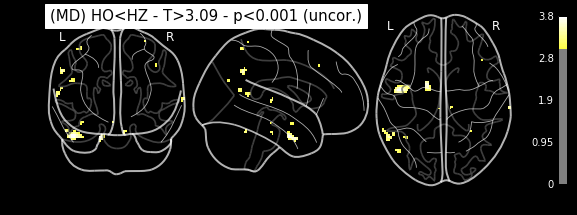

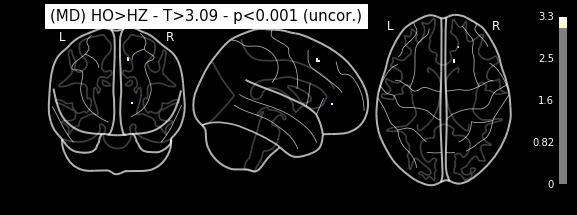

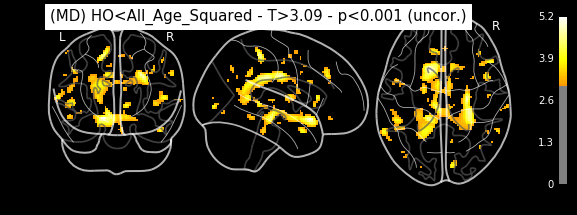

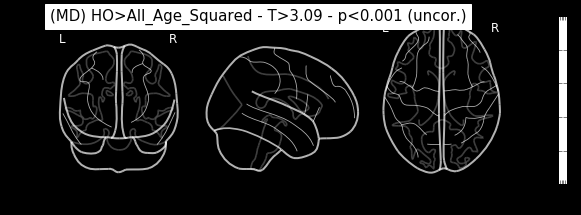

In [42]:
each = 'MD'
spm_mat_file = '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    plotting.plot_glass_brain(thresholded_map1,
                      title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
                      black_bg=True, display_mode='ortho', threshold=threshold1)  
plotting.show()

In [312]:
def plot_stat_map(img, row_l, start, end, step, title, threshold=None, axis='z', method='plot_stat_map', overlay=None):
    slice_nb = int(abs(((end - start) / float(step))))
    for line in range(int(slice_nb/float(row_l) + 1)):
        opt = {'title':{True:title, 
                        False:None}[line==0], 
               'colorbar':True,
               'black_bg':True, 
               'display_mode':axis,
               'threshold':threshold,
               'cmap': plotting.cm.blue_transparent,
               'cut_coords':range(start + line * row_l * step,
                                       start + (line+1) * row_l * step,
                                       step)}
        if method == 'plot_prob_atlas':
            opt.update({'maps_img': img,
                        'view_type': 'contours'})
        elif method == 'plot_stat_map':
            opt.update({'stat_map_img': img})
        
        t = getattr(plotting, method).__call__(**opt)
        
        # Add overlay
        if not overlay is None:
            if isinstance(overlay, list):
                for each in overlay:
                    t.add_overlay(each, cmap=plotting.cm.red_transparent)
            else:
                t.add_overlay(overlay, cmap=plotting.cm.red_transparent)

/tmp/output/MD/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/MD/analysis/estimatecontrasts/spmT_0011.nii


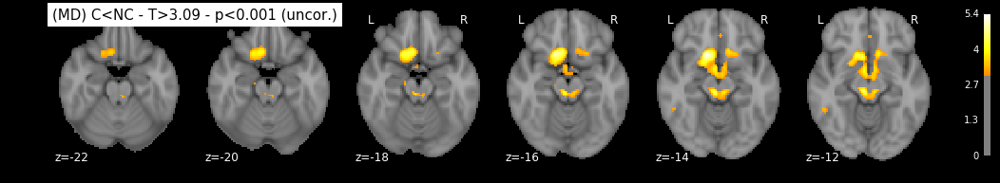

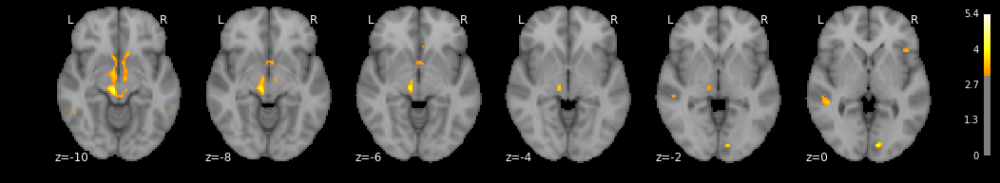

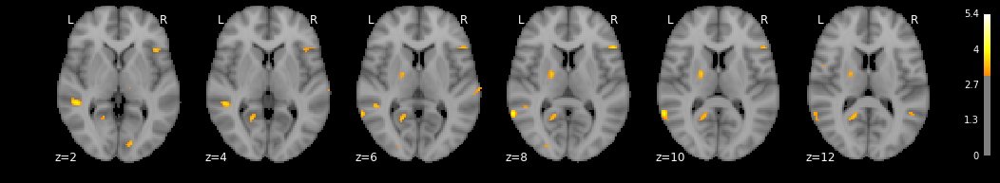

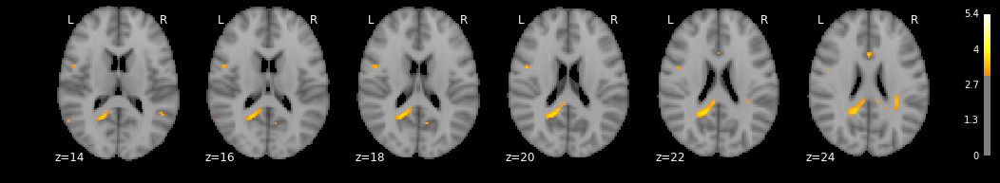

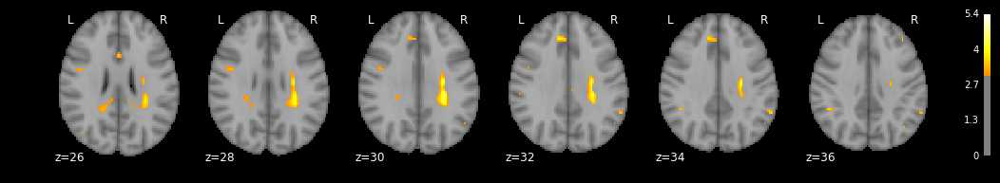

...

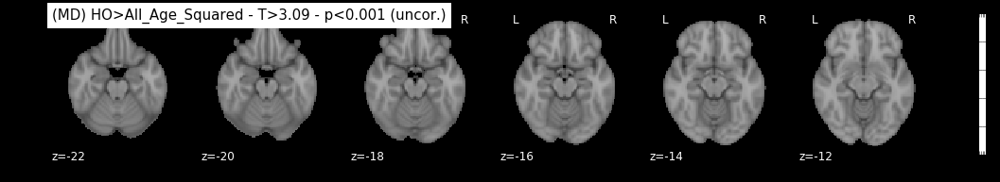

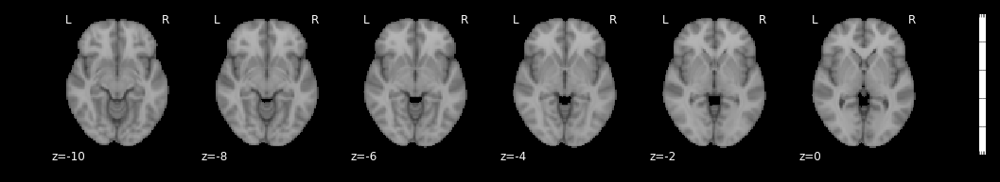

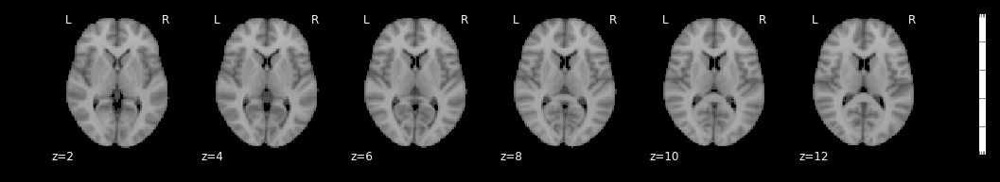

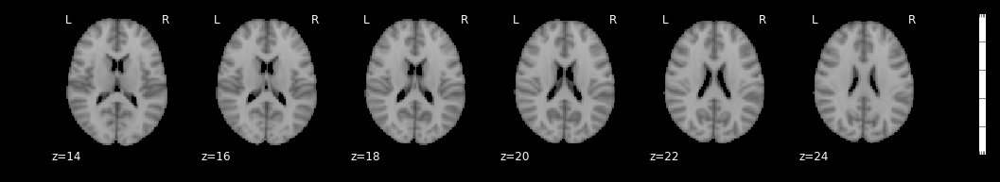

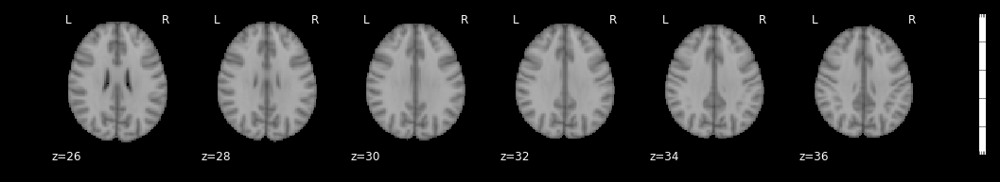

In [44]:
each = 'MD'
spm_mat_file = '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)

    plot_stat_map(thresholded_map1, row_l=6, start=-22, end=34, step=2,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1))
        
plotting.show()


/tmp/output/MD/analysis/estimatecontrasts/spmT_0008.nii


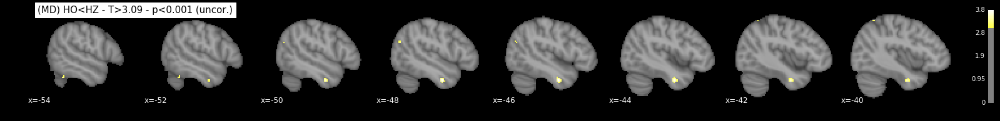

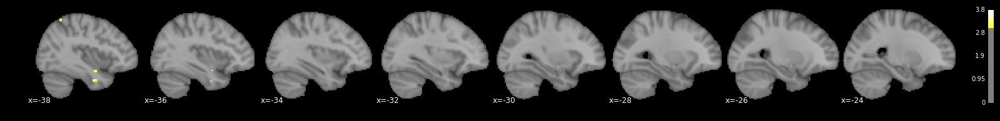

In [45]:
i = 8
img = '/tmp/output/MD/analysis/estimatecontrasts/spmT_00%02d.nii'%(i)
print img
contrast_name = n3.inputs.contrasts[i-1][0]
thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)

plot_stat_map(thresholded_map1, axis='x', row_l=8, start=-54, end=-38, step=2,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%('MD', contrast_name, threshold1))

# pyAAL

In [46]:
pyAAL.AAL_label('Rectus_L')

2701

In [47]:
pyAAL.AAL_name('4101')

'Hippocampus_L'

In [48]:
spm_mat_file = '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat'
out = pyAAL.pyAAL(spm_mat_file, contrast=6, mode=0, verbose=False) # Local Maxima Labeling Mode
df = pyAAL.to_dataframe(out)
df

Contrast: C<NC


,"x,y,z {mm}",label name,dist {mm},
0,-14 16 -14,Rectus_L,0.00,
1,-14 16 -14,OFCmed_L,3.46,
2,-14 16 -14,Caudate_L,3.46,
3,-6 -26 -12,Cerebelum_4_5_L,7.21,
4,-6 -26 -12,Cerebelum_3_L,8.25,
5,-6 -26 -12,ParaHippocampal_L,8.25,
6,-6 0 -12,Caudate_L,6.00,
7,-6 0 -12,Pallidum_L,6.63,
8,-6 0 -12,Amygdala_L,7.21,
9,-14 -38 54,Cingulate_Mid_L,0.00,


In [49]:
spm_mat_file = '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat'
i = 6
out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=1, verbose=False) # Extended Local Maxima Labeling Mode
df = pyAAL.to_dataframe(out)
display_html(df)

Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,OFCmed_L,20.39,515,19.09,550,
1,-14 16 -14,Frontal_Med_Orb_L,17.86,515,12.80,719,
2,-14 16 -14,OFCpost_L,17.28,515,15.70,567,
3,-14 16 -14,Olfactory_L,15.53,515,28.57,280,
4,-14 16 -14,Putamen_L,12.62,515,6.44,1009,
5,-14 16 -14,Caudate_L,3.88,515,2.08,962,
6,-14 16 -14,Rectus_L,0.19,515,0.12,852,
7,-14 16 -14,OUTSIDE,0.19,515,0.00,0,
8,-6 -26 -12,Hippocampus_L,93.20,515,51.50,932,
9,-6 -26 -12,Lingual_L,1.94,515,0.48,2095,


In [50]:
spm_mat_file = '/tmp/output/MD/analysis/estimatecontrasts/SPM.mat'
i = 6
out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False) # Cluster Labeling Mode
df = pyAAL.to_dataframe(out)
display_html(df)

Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,Olfactory_L,53.84,964,185.36,280,
1,-14 16 -14,Olfactory_R,12.86,964,42.91,289,
2,-14 16 -14,Rectus_R,12.14,964,15.70,745,
3,-14 16 -14,OFCmed_R,7.37,964,11.43,621,
4,-14 16 -14,OFCmed_L,5.39,964,9.45,550,
5,-14 16 -14,Caudate_R,2.70,964,2.62,994,
6,-14 16 -14,Frontal_Med_Orb_L,1.87,964,2.50,719,
7,-14 16 -14,OFCpost_R,1.45,964,2.50,561,
8,-14 16 -14,Thalamus_L,1.24,964,1.09,1100,
9,-14 16 -14,OFCpost_L,0.31,964,0.53,567,


Results from Mean Diffusivity maps

In [51]:
print spm_mat_file
for i in range(6, 12):
    out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False)
    try:
        df = pyAAL.to_dataframe(out)
        display_html(df)
    except IndexError:
        print 'Error during conversion: empty map?'
        print out

/tmp/output/MD/analysis/estimatecontrasts/SPM.mat
Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,Olfactory_L,53.84,964,185.36,280,
1,-14 16 -14,Olfactory_R,12.86,964,42.91,289,
2,-14 16 -14,Rectus_R,12.14,964,15.70,745,
3,-14 16 -14,OFCmed_R,7.37,964,11.43,621,
4,-14 16 -14,OFCmed_L,5.39,964,9.45,550,
5,-14 16 -14,Caudate_R,2.70,964,2.62,994,
6,-14 16 -14,Frontal_Med_Orb_L,1.87,964,2.50,719,
7,-14 16 -14,OFCpost_R,1.45,964,2.50,561,
8,-14 16 -14,Thalamus_L,1.24,964,1.09,1100,
9,-14 16 -14,OFCpost_L,0.31,964,0.53,567,


Contrast: C>NC
Error during conversion: empty map?
[]
Contrast: HO<HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-46 -6 -32,Temporal_Inf_L,1.39,72,0.03,3200,
1,-16 -2 -34,ParaHippocampal_L,26.92,26,0.72,978,
2,-16 -2 -34,OUTSIDE,3.85,26,0.00,0,
3,-58 -56 36,Angular_L,47.06,17,0.68,1173,
4,-58 -56 36,Parietal_Inf_L,41.18,17,0.29,2447,
5,-58 -56 36,OUTSIDE,5.88,17,0.00,0,


Contrast: HO>HZ
Error during conversion: empty map?
[]
Contrast: HO<All_Age_Squared


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,Olfactory_L,54.08,773,149.29,280,
1,-14 16 -14,Olfactory_R,13.58,773,36.33,289,
2,-14 16 -14,Rectus_R,13.32,773,13.83,745,
3,-14 16 -14,OFCmed_R,8.54,773,10.63,621,
4,-14 16 -14,OFCmed_L,4.66,773,6.55,550,
5,-14 16 -14,Caudate_R,1.81,773,1.41,994,
6,-14 16 -14,Caudate_L,1.42,773,1.14,962,
7,-14 16 -14,Frontal_Med_Orb_L,1.42,773,1.53,719,
8,-14 16 -14,Thalamus_L,0.78,773,0.55,1100,
9,-14 16 -14,OFCpost_L,0.13,773,0.18,567,


Contrast: HO>All_Age_Squared
Error during conversion: empty map?
[]


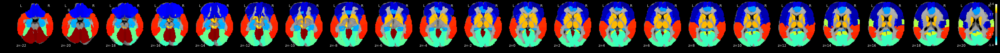

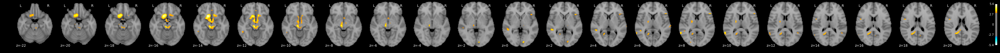

In [52]:
img = plotting.plot_stat_map('/tmp/output/MD/analysis/estimatecontrasts/spmT_0006.nii', 
                             black_bg=True, colorbar=True, threshold=3.1, cut_coords=range(-22,22,2), display_mode='z')
img.add_overlay(aal_fp) #pyAAL.roi_mask('OFCmed_L'))
img = plotting.plot_stat_map('/tmp/output/MD/analysis/estimatecontrasts/spmT_0006.nii', 
                             black_bg=True, colorbar=True, threshold=3.1, cut_coords=range(-22,22,2), display_mode='z')


# Results from the analysis of Fractional Anisotropy maps

/tmp/output/FA/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0010.nii


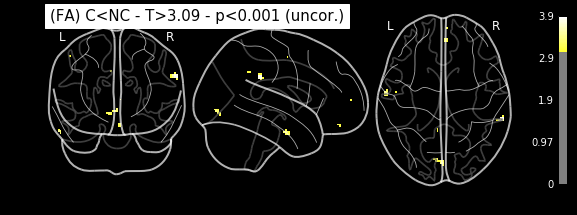

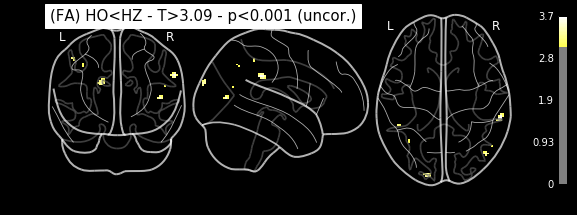

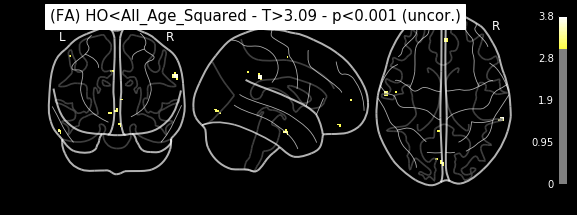

In [53]:
each = 'FA'
spm_mat_file = '/tmp/output/FA/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12, 2):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    plotting.plot_glass_brain(thresholded_map1,
                      title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
                      black_bg=True, display_mode='ortho', threshold=threshold1)  
plotting.show()

/tmp/output/FA/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/FA/analysis/estimatecontrasts/spmT_0011.nii


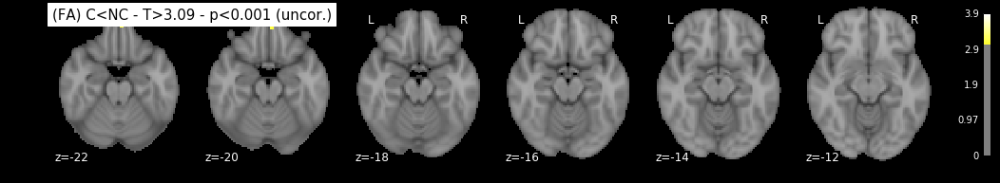

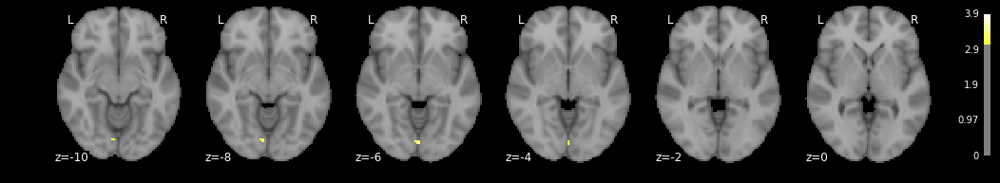

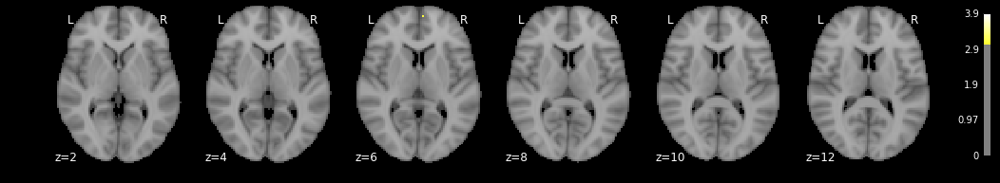

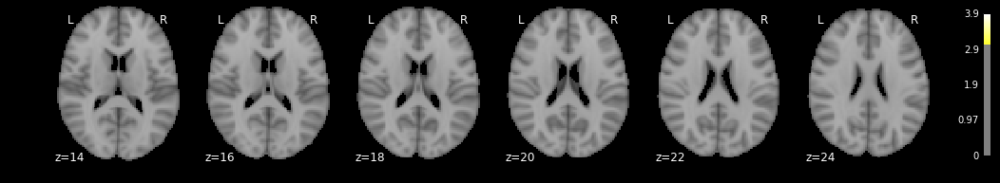

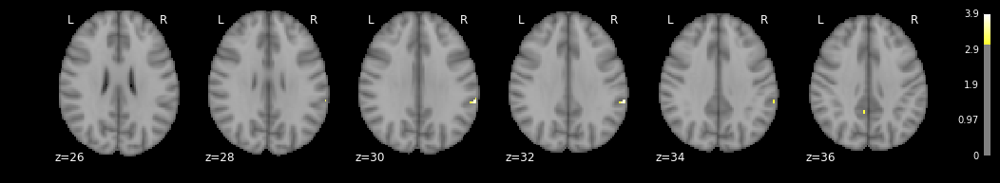

...

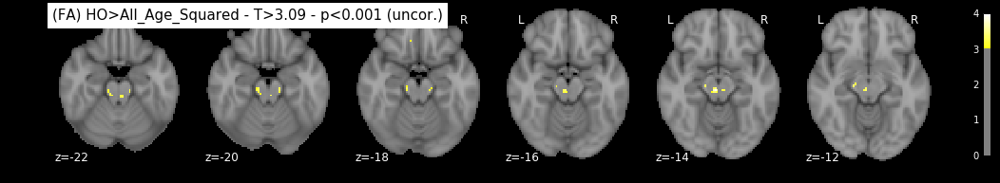

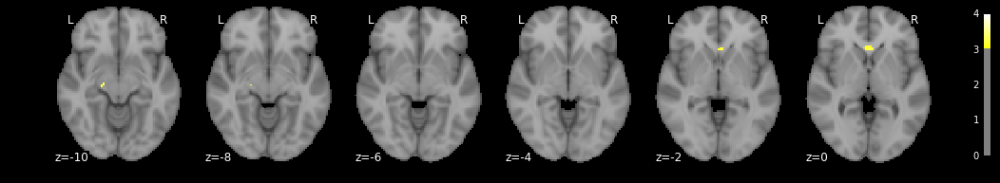

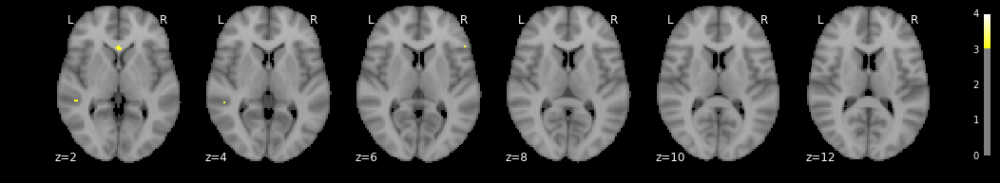

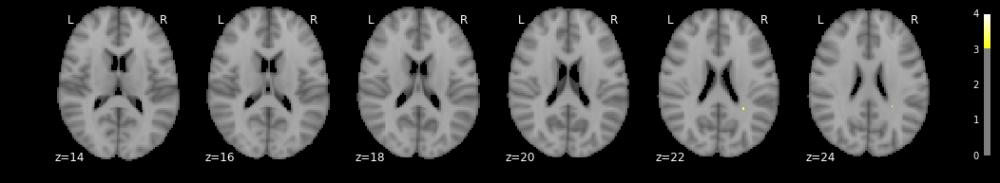

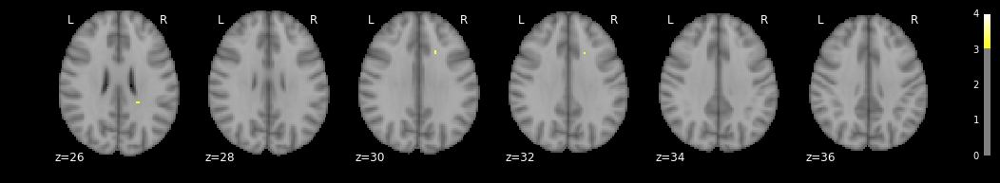

In [54]:
each = 'FA'
spm_mat_file = '/tmp/output/FA/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    #plotting.plot_stat_map(thresholded_map1,
    #                  title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
    #                  black_bg=True, display_mode='z', threshold=threshold1, cut_coords=range(-22,34,2))  
    plot_stat_map(thresholded_map1, row_l=6, start=-22, end=34, step=2,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1))

plotting.show()

In [55]:
print spm_mat_file
for i in range(6, 12):
    out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False)
    try:
        df = pyAAL.to_dataframe(out)
        display_html(df)
    except IndexError:
        print 'Error during conversion: empty map?'
        print out

/tmp/output/FA/analysis/estimatecontrasts/SPM.mat
Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,62 -38 32,SupraMarginal_R,7.14,14,0.05,1974,
1,-62 -10 -28,Temporal_Inf_L,10.00,10,0.03,3200,


Contrast: C>NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-4 -24 -14,OUTSIDE,5.26,19,0.00,0,
1,-8 20 -30,OUTSIDE,2.63,38,0.00,0,
2,12 -24 -20,OUTSIDE,6.25,16,0.00,0,
3,-18 -18 -10,OUTSIDE,2.78,36,0.00,0,
4,0 24 0,Olfactory_R,70.00,20,4.84,289,
5,0 24 0,OUTSIDE,5.00,20,0.00,0,


Contrast: HO<HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,62 -36 32,SupraMarginal_R,6.25,16,0.05,1974,
1,-16 -98 24,Occipital_Sup_L,35.71,14,0.37,1366,
2,-16 -98 24,OUTSIDE,7.14,14,0.00,0,


Contrast: HO>HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-24 46 44,Frontal_Sup_2_L,16.67,18,0.06,4873,
1,-24 46 44,OUTSIDE,5.56,18,0.00,0,
2,22 28 28,OUTSIDE,10.00,10,0.00,0,


Contrast: HO<All_Age_Squared


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,62 -38 32,SupraMarginal_R,8.33,12,0.05,1974,


Contrast: HO>All_Age_Squared


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-4 -24 -14,OUTSIDE,6.67,15,0.00,0,
1,-8 20 -30,OUTSIDE,4.00,25,0.00,0,
2,-18 -18 -12,OUTSIDE,3.45,29,0.00,0,
3,2 22 0,Olfactory_R,85.19,27,7.96,289,
4,2 22 0,OUTSIDE,3.70,27,0.00,0,
5,2 -30 -20,OUTSIDE,10.00,10,0.00,0,


# Results from the analysis of Axial Diffusivity maps

/tmp/output/L1/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0011.nii


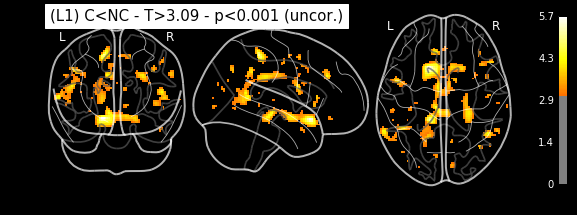

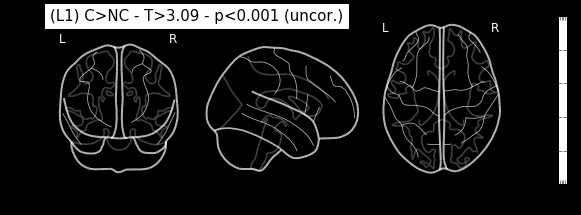

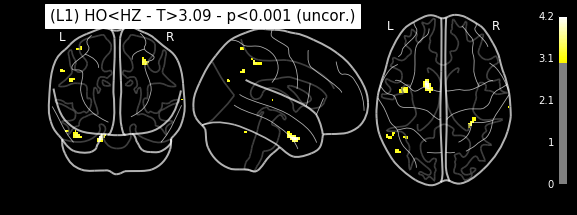

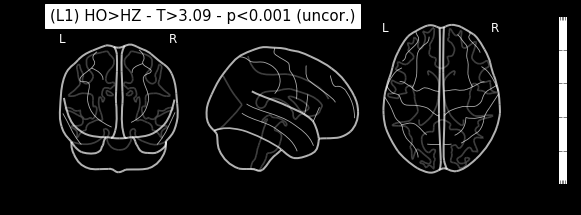

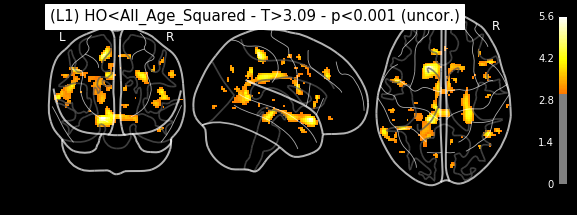

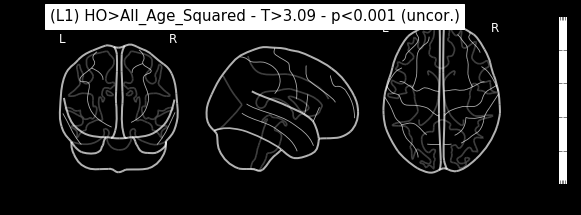

In [56]:
each = 'L1'
spm_mat_file = '/tmp/output/L1/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    plotting.plot_glass_brain(thresholded_map1,
                      title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
                      black_bg=True, display_mode='ortho', threshold=threshold1)  
plotting.show()

/tmp/output/L1/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/L1/analysis/estimatecontrasts/spmT_0011.nii


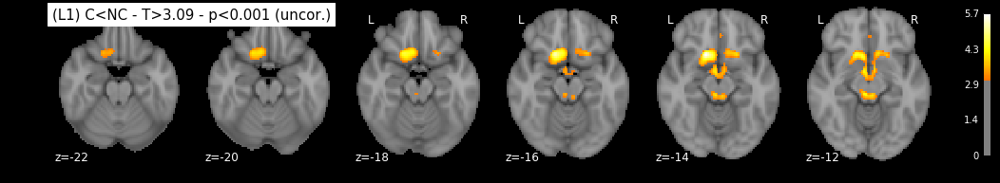

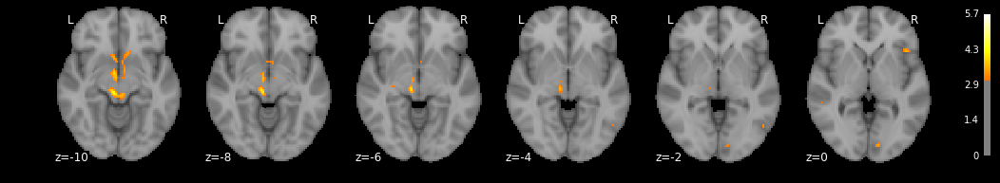

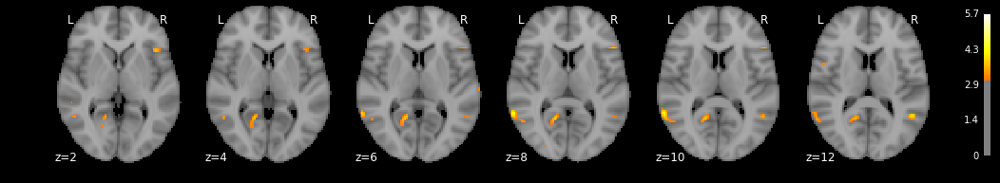

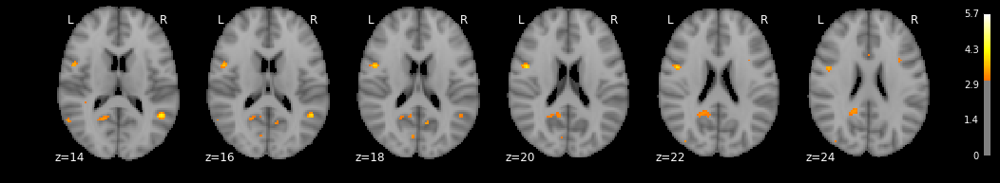

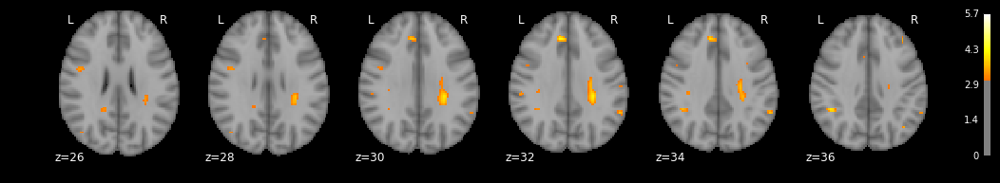

...

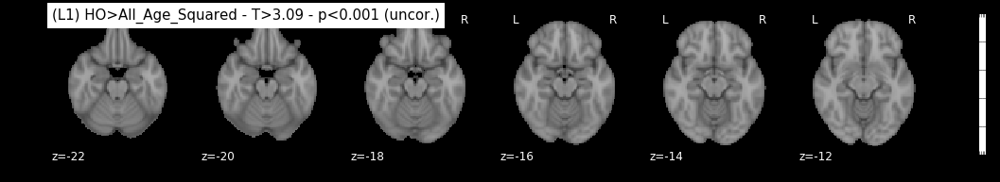

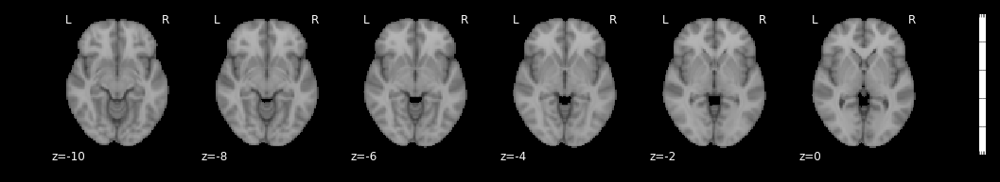

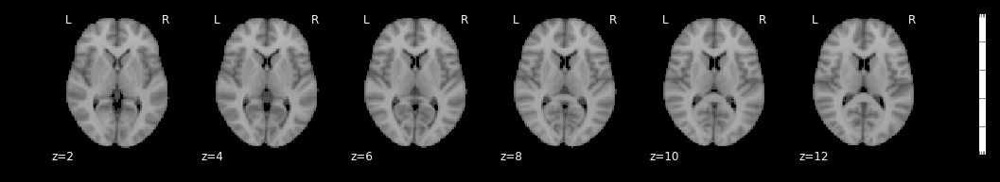

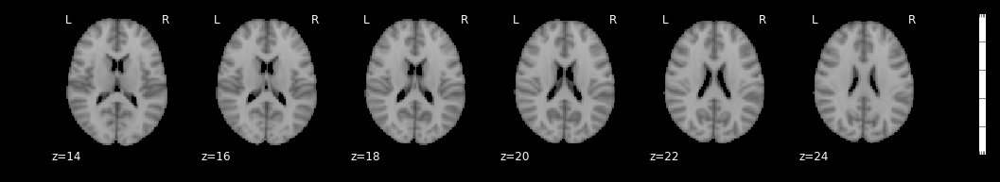

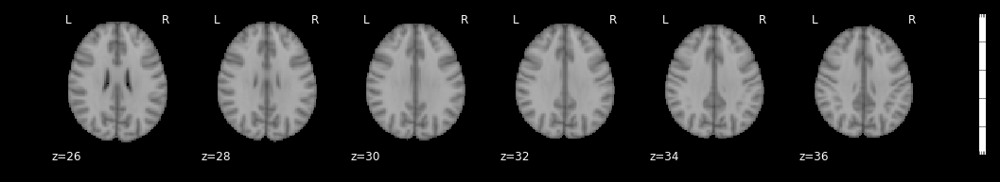

In [57]:
each = 'L1'
spm_mat_file = '/tmp/output/L1/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    #plotting.plot_stat_map(thresholded_map1,
    #                  title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
    #                  black_bg=True, display_mode='z', threshold=threshold1, cut_coords=range(-22,34,2))  
    plot_stat_map(thresholded_map1, row_l=6, start=-22, end=34, step=2,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1))

plotting.show()

In [58]:
print spm_mat_file
for i in range(6, 12):
    out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False)
    try:
        df = pyAAL.to_dataframe(out)
        display_html(df)
    except IndexError:
        print 'Error during conversion: empty map?'
        print out

/tmp/output/L1/analysis/estimatecontrasts/SPM.mat
Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-16 16 -14,Olfactory_L,45.31,799,129.29,280,
1,-16 16 -14,Olfactory_R,14.89,799,41.18,289,
2,-16 16 -14,Rectus_R,13.14,799,14.09,745,
3,-16 16 -14,OFCmed_R,8.89,799,11.43,621,
4,-16 16 -14,OFCmed_L,7.38,799,10.73,550,
5,-16 16 -14,Frontal_Med_Orb_L,3.38,799,3.76,719,
6,-16 16 -14,Caudate_R,3.00,799,2.41,994,
7,-16 16 -14,OFCpost_R,1.88,799,2.67,561,
8,-16 16 -14,OFCpost_L,0.75,799,1.06,567,
9,-16 16 -14,Thalamus_L,0.63,799,0.45,1100,


Contrast: C>NC
Error during conversion: empty map?
[]
Contrast: HO<HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-18 0 -36,Temporal_Pole_Sup_L,51.11,45,1.79,1285,
1,-18 0 -36,ParaHippocampal_L,37.78,45,1.74,978,
2,-18 0 -36,Temporal_Pole_Mid_L,2.22,45,0.13,755,
3,-18 0 -36,OUTSIDE,2.22,45,0.00,0,
4,28 -44 46,Postcentral_R,53.33,15,0.21,3823,
5,28 -44 46,SupraMarginal_R,20.00,15,0.15,1974,
6,28 -44 46,OUTSIDE,6.67,15,0.00,0,
7,-42 -6 -32,Temporal_Inf_L,3.33,30,0.03,3200,


Contrast: HO>HZ
Error during conversion: empty map?
[]
Contrast: HO<All_Age_Squared


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-16 16 -14,OFCmed_L,31.39,309,17.64,550,
1,-16 16 -14,Rectus_L,30.42,309,11.03,852,
2,-16 16 -14,OFCpost_L,21.04,309,11.46,567,
3,-16 16 -14,Olfactory_L,8.41,309,9.29,280,
4,-16 16 -14,Caudate_L,3.88,309,1.25,962,
5,-16 16 -14,OUTSIDE,0.32,309,0.00,0,
6,-14 -38 54,Paracentral_Lobule_L,34.13,126,3.19,1349,
7,-14 -38 54,Precuneus_L,24.60,126,0.88,3528,
8,-14 -38 54,Cingulate_Mid_L,17.46,126,1.13,1941,
9,-14 -38 54,OUTSIDE,0.79,126,0.00,0,


Contrast: HO>All_Age_Squared
Error during conversion: empty map?
[]


# Results from the analysis of Radial Diffusivity maps

/tmp/output/RD/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0011.nii


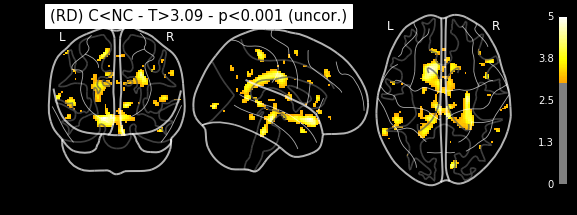

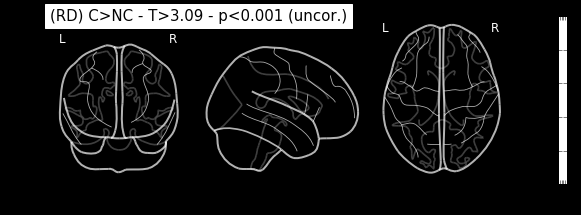

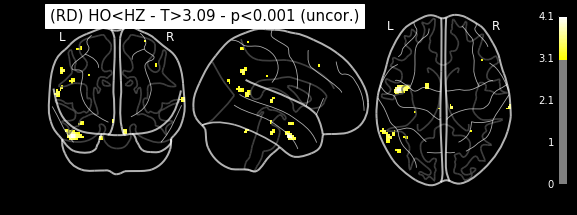

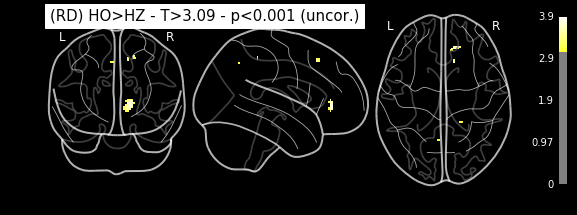

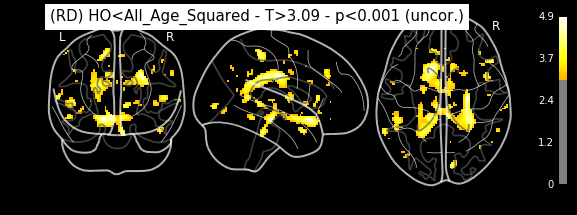

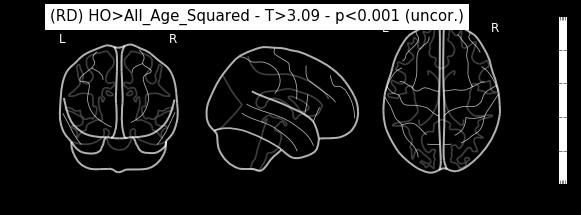

In [59]:
each = 'RD'
spm_mat_file = '/tmp/output/RD/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    plotting.plot_glass_brain(thresholded_map1,
                      title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
                      black_bg=True, display_mode='ortho', threshold=threshold1)  
plotting.show()

/tmp/output/RD/analysis/estimatecontrasts/spmT_0006.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0007.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0008.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0009.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0010.nii
/tmp/output/RD/analysis/estimatecontrasts/spmT_0011.nii


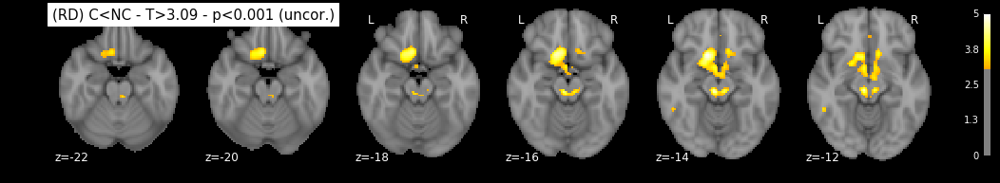

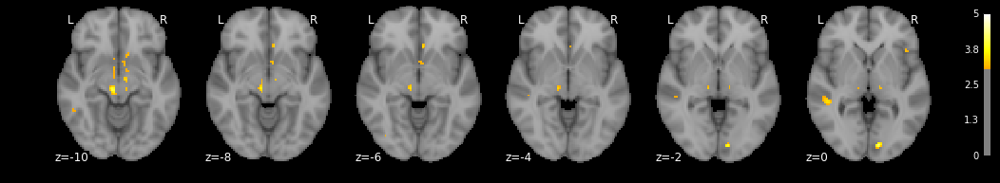

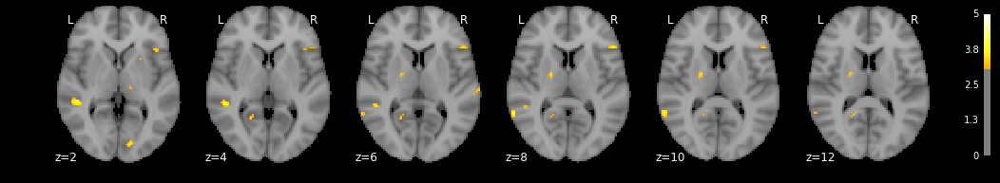

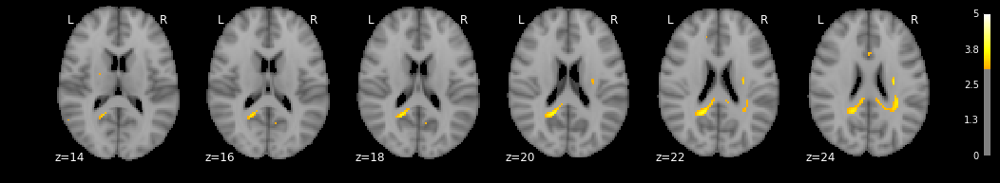

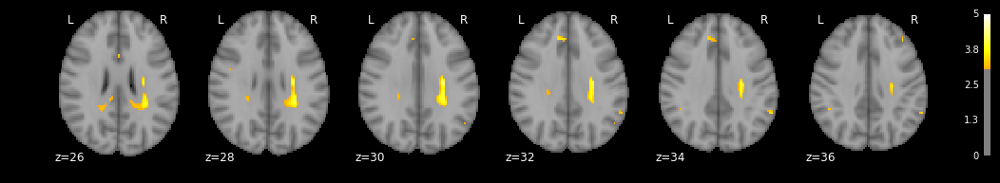

...

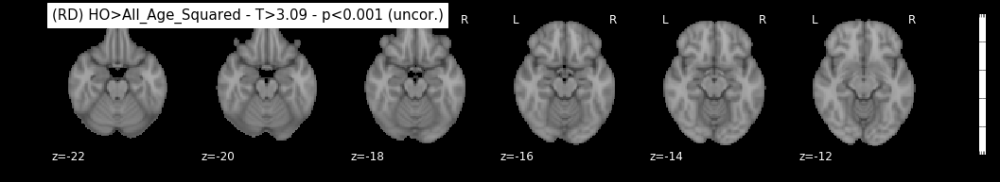

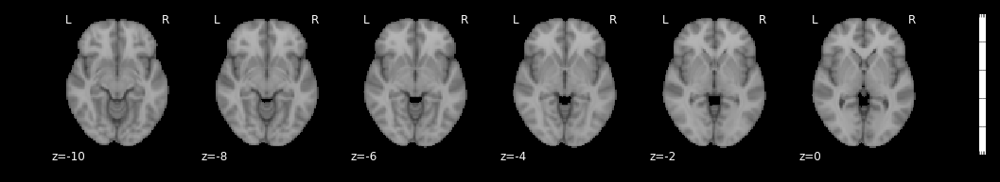

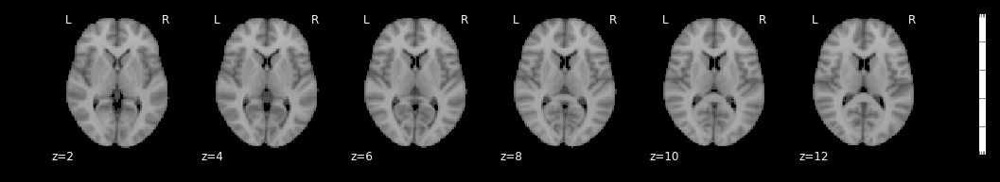

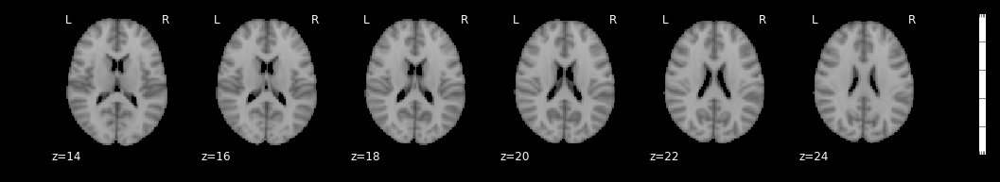

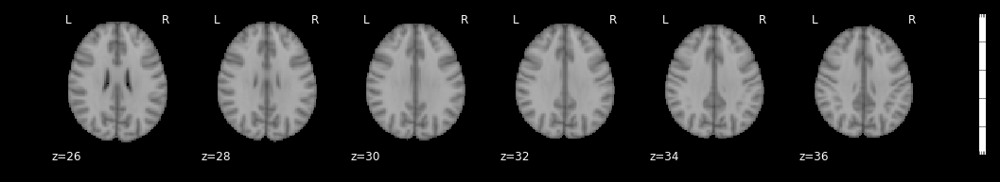

In [60]:
each = 'RD'
spm_mat_file = '/tmp/output/RD/analysis/estimatecontrasts/SPM.mat'
for i in range(6, 12):
    img = '/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=0)
    #plotting.plot_stat_map(thresholded_map1,
    #                  title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
    #                  black_bg=True, display_mode='z', threshold=threshold1, cut_coords=range(-22,34,2))  
    plot_stat_map(thresholded_map1, row_l=6, start=-22, end=34, step=2,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1))

plotting.show()

In [61]:
print spm_mat_file
for i in range(6, 12):
    out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False)
    try:
        df = pyAAL.to_dataframe(out)
        display_html(df)
    except IndexError:
        print 'Error during conversion: empty map?'
        print out

/tmp/output/RD/analysis/estimatecontrasts/SPM.mat
Contrast: C<NC


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,Olfactory_L,35.31,572,72.14,280,
1,-14 16 -14,Rectus_R,20.10,572,15.44,745,
2,-14 16 -14,Olfactory_R,19.23,572,38.06,289,
3,-14 16 -14,OFCpost_L,11.01,572,11.11,567,
4,-14 16 -14,OFCmed_L,5.77,572,6.00,550,
5,-14 16 -14,Caudate_R,2.62,572,1.51,994,
6,-14 16 -14,Frontal_Med_Orb_L,2.27,572,1.81,719,
7,-14 16 -14,Caudate_L,1.57,572,0.94,962,
8,-14 16 -14,Rectus_L,0.17,572,0.12,852,
9,-14 16 -14,Frontal_Med_Orb_R,0.17,572,0.12,856,


Contrast: C>NC
Error during conversion: empty map?
[]
Contrast: HO<HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-48 -6 -32,Temporal_Inf_L,1.16,86,0.03,3200,
1,-48 -6 -32,OUTSIDE,1.16,86,0.00,0,
2,-58 -56 36,Angular_L,44.44,18,0.68,1173,
3,-58 -56 36,Parietal_Inf_L,44.44,18,0.33,2447,
4,-58 -56 36,OUTSIDE,5.56,18,0.00,0,
5,8 -24 -28,OUTSIDE,8.33,12,0.00,0,
6,-64 -50 12,Temporal_Mid_L,57.14,14,0.16,4942,
7,-64 -50 12,Temporal_Sup_L,7.14,14,0.04,2296,
8,70 -24 6,Temporal_Sup_R,10.00,10,0.03,3141,
9,-38 -4 -20,OUTSIDE,10.00,10,0.00,0,


Contrast: HO>HZ


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,14 40 0,Cingulate_Ant_R,20.00,30,0.46,1313,
1,14 40 0,Frontal_Med_Orb_R,6.67,30,0.23,856,
2,14 40 0,OUTSIDE,3.33,30,0.00,0,


Contrast: HO<All_Age_Squared


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,-14 16 -14,Olfactory_L,34.04,473,57.50,280,
1,-14 16 -14,Rectus_R,21.35,473,13.56,745,
2,-14 16 -14,Olfactory_R,20.72,473,33.91,289,
3,-14 16 -14,OFCpost_L,12.05,473,10.05,567,
4,-14 16 -14,OFCmed_L,4.86,473,4.18,550,
5,-14 16 -14,Caudate_R,2.54,473,1.21,994,
6,-14 16 -14,Caudate_L,1.90,473,0.94,962,
7,-14 16 -14,Rectus_L,1.69,473,0.94,852,
8,-14 16 -14,OUTSIDE,0.21,473,0.00,0,
9,26 -16 32,OUTSIDE,0.22,452,0.00,0,


Contrast: HO>All_Age_Squared
Error during conversion: empty map?
[]


# Testing main effect of age without genotype

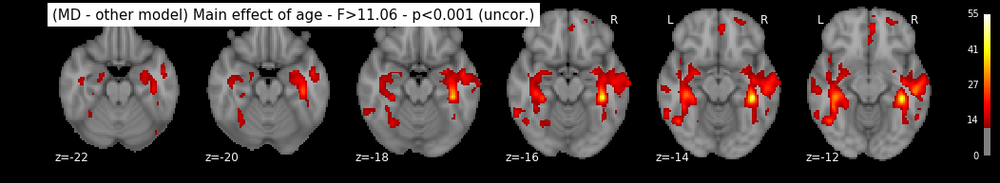

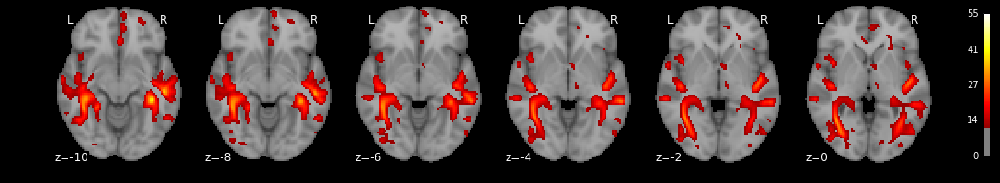

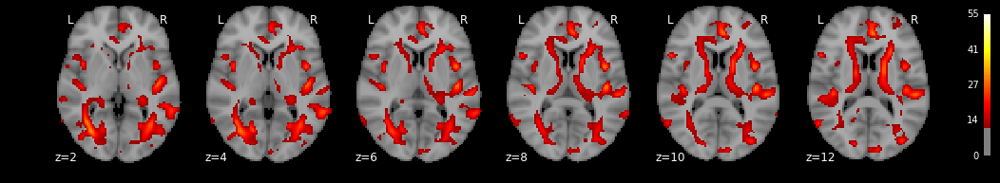

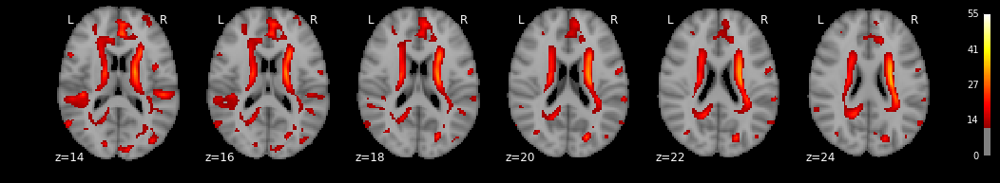

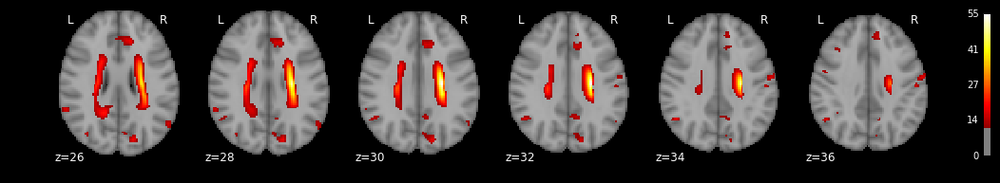

In [187]:
each = 'MD'
spm_mat_file = '/tmp/output2/MD/analysis/estimatecontrasts/SPM.mat'
i=2
img = '/tmp/output2/%s/analysis/estimatecontrasts/spmF_00%02d.nii'%(each, i)
contrast_name = n3.inputs.contrasts[i-1][0]
thresholded_map1, threshold1 = map_threshold(img, threshold=1e-28, cluster_threshold=30)
plot_stat_map(thresholded_map1, threshold=threshold1, row_l=6, start=-22, end=34, step=2, axis='z',
             title= '(%s - other model) Main effect of age - F>%.02f - p<0.001 (uncor.)'%(each, threshold1))

/tmp/output2/MD/analysis/estimatecontrasts/spmF_0002.nii
[0, 0]
Contrast: Main effect Agesq
[340, 66, 23, 82, 83, 80, 20, 142, 49, 24, 25, 29, 45, 105, 100, 12, 1083, 71, 70, 6383, 95, 90, 14, 16, 11, 10, 13, 38, 51, 36, 53, 34, 55, 18, 31, 131, 7886]


,"x,y,z {mm}",nom du label,% Cluster,Nb Vx Cluster,% Label,Nb Vx Label,
0,26 -16 30,Frontal_Inf_Oper_R,40.63,7886,229.02,1399,
1,26 -16 30,Temporal_Pole_Mid_R,14.84,7886,98.57,1187,
2,26 -16 30,Temporal_Pole_Sup_R,8.67,7886,51.12,1338,
3,26 -16 30,ParaHippocampal_R,6.07,7886,42.31,1132,
4,26 -16 30,Putamen_R,4.36,7886,32.33,1064,
5,26 -16 30,Hippocampus_R,3.70,7886,30.87,946,
6,26 -16 30,Heschl_R,3.59,7886,113.65,249,
7,26 -16 30,SupraMarginal_R,3.59,7886,14.34,1974,
8,26 -16 30,Occipital_Inf_R,2.64,7886,21.03,989,
9,26 -16 30,Amygdala_R,1.86,7886,59.27,248,


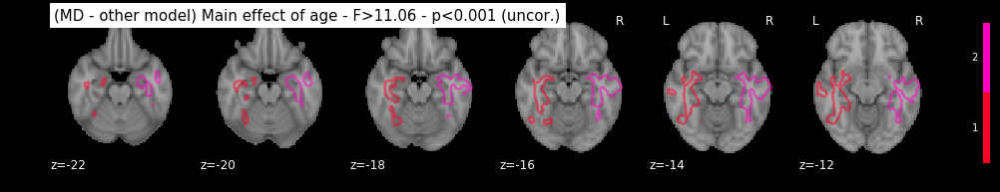

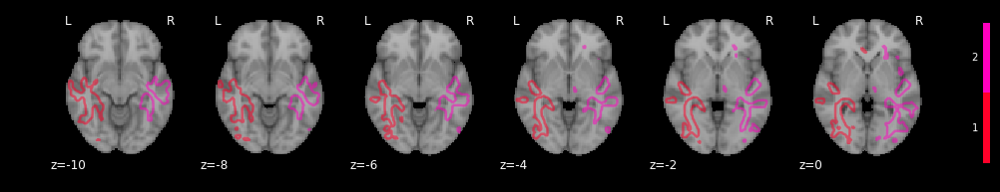

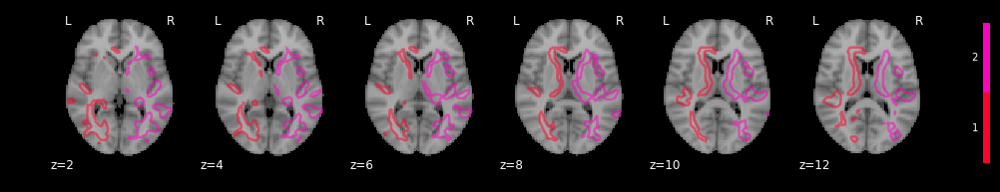

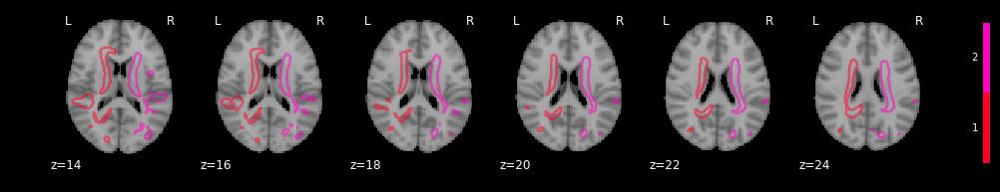

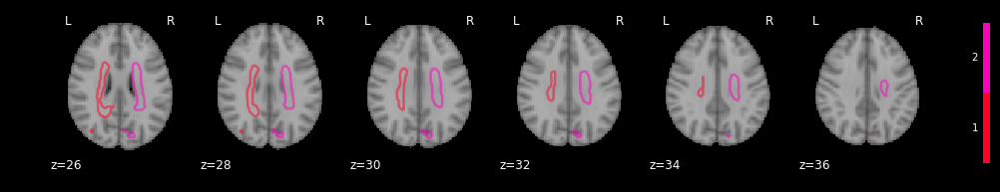

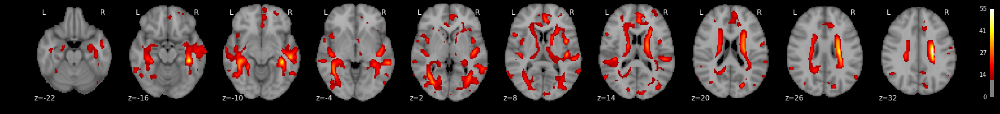

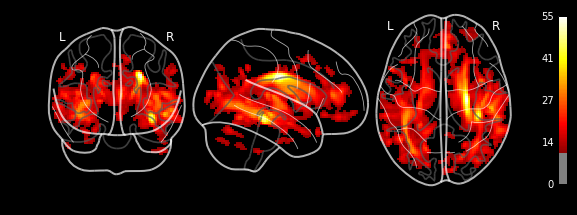

In [207]:
each = 'MD'
spm_mat_file = '/tmp/output2/MD/analysis/estimatecontrasts/SPM.mat'
i=2
img = '/tmp/output2/%s/analysis/estimatecontrasts/spmF_00%02d.nii'%(each, i)
print img
contrast_name = n3.inputs.contrasts[i-1][0]
thresholded_map1, threshold1 = map_threshold(img, threshold=1e-28, cluster_threshold=30)
from nilearn import regions
import string
regions_map, index = regions.connected_regions( thresholded_map1, min_region_size=9000, extract_type='connected_components')
print index
out = pyAAL.pyAAL(spm_mat_file, contrast=i, mode=2, verbose=False)
df = pyAAL.to_dataframe(out)
print [string.atoi(e) for e in set(df['Nb Vx Cluster'].tolist())]
display_html(df)

    #plotting.plot_stat_map(thresholded_map1,
    #                  title='(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1), colorbar=True,
    #                  black_bg=True, display_mode='z', threshold=threshold1, cut_coords=range(-22,34,2))  
plot_stat_map(regions_map, row_l=6, start=-22, end=34, step=2, axis='z',
             title= '(%s - other model) Main effect of age - F>%.02f - p<0.001 (uncor.)'%(each, threshold1), 
              method='plot_prob_atlas', threshold=threshold1)
plotting.plot_stat_map(thresholded_map1, black_bg=True, colorbar=True, threshold=threshold1, display_mode='z', cut_coords=range(-22,34,6))
plotting.plot_glass_brain(thresholded_map1, black_bg=True, colorbar=True, threshold=threshold1)
plotting.show()

In [ ]:
plot_stat_map(image.index_img(regions_map, 0), row_l=6, start=-22,end=34, step=6, axis='z', threshold=None, title='')
plot_stat_map(image.index_img(regions_map, 1), row_l=6, start=-22,end=34, step=6, axis='z', threshold=None, title='')

In [219]:

image.index_img(regions_map, 1).to_filename('/tmp/test1.nii.gz')
aal = np.array(image.load_img(aal_fp).dataobj, copy=True)
hippolab = pyAAL.AAL_label('Hippocampus_R')
aal[aal!=hippolab] = 0
image.new_img_like(aal_fp, aal).to_filename('/tmp/hippo_right.nii.gz')

# Comparing images for matching contrast maps

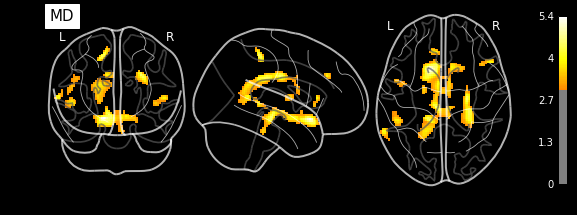

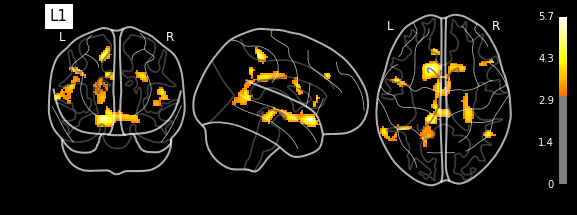

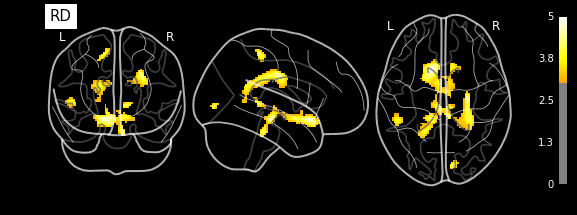

In [170]:
#each = 'MD'
#spm_mat_file = '/tmp/output2/MD/analysis/estimatecontrasts/SPM.mat'
i=6
img = []
from soma import aims
a = aims.read('/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%('MD', i)).arraydata()
contrast_name = n3.inputs.contrasts[i-1][0]
for each in ['MD', 'L1', 'RD']:
    img.append('/tmp/output/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i))
    #print img[-1].shape
    if each != 'MD': a = a + aims.read(img[-1]).arraydata()
    thresholded_map1, threshold1 = map_threshold(img[-1], threshold=0.001, cluster_threshold=30)
    plotting.plot_glass_brain(thresholded_map1, black_bg=True, colorbar=True, threshold=threshold1, title=each)

In [264]:
img = np.array(image.load_img('/home/grg/data/templates/Zilles_Anatomy/OFC_Fo2.nii').dataobj, copy=True)
img[img!=0] = 1
i = image.new_img_like('/home/grg/data/templates/Zilles_Anatomy/OFC_Fo2.nii', img)
i.to_filename('/tmp/ofc_mask.nii.gz')

/home/grg/spm/data/designmatrix2.xls
/tmp/output_FSvent/MD/analysis/estimatecontrasts/spmT_0006.nii
3.09023230617


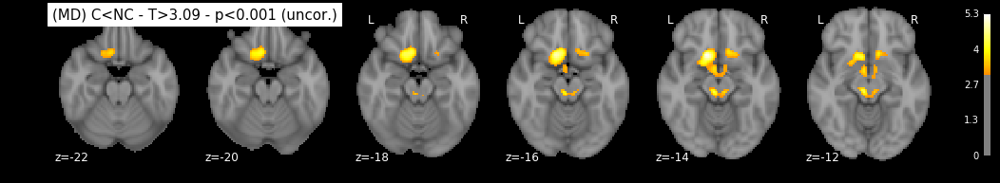

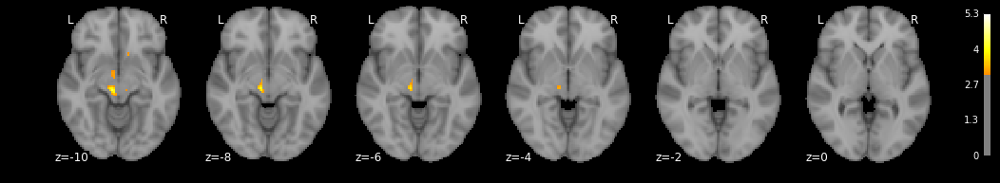

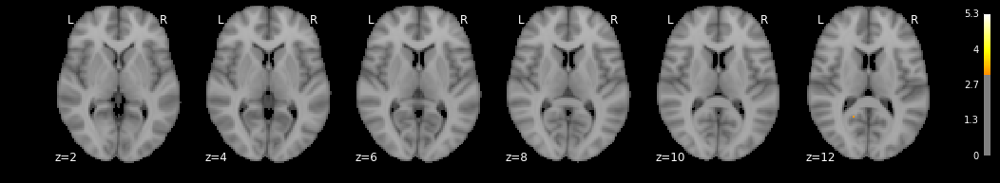

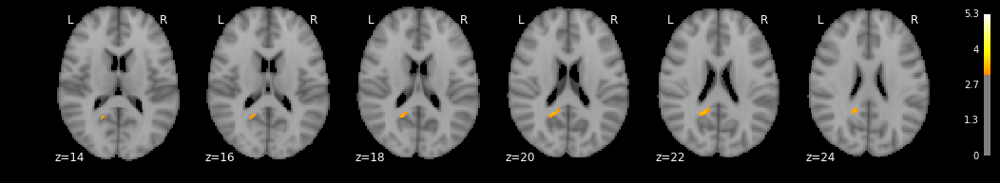

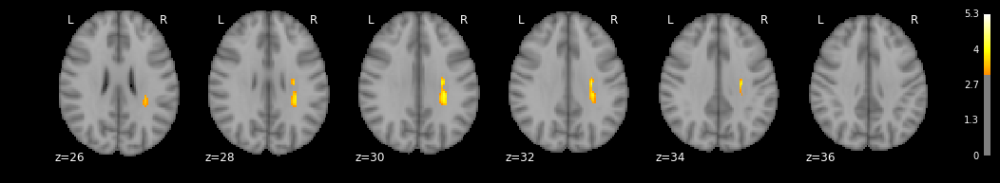

In [274]:
each = 'MD'
spm_mat_file = '/tmp/output_FSvent/MD/analysis/estimatecontrasts/SPM.mat'
print excel_fp
a = mreg.multiple_regression_analysis(each, excel_fp, '/tmp/output_FSvent/', mask_fp, verbose=False)
n1 = a.get_node('modeldesign')
n3 = a.get_node('estimatecontrasts')
for i in range(6, 7):
    img = '/tmp/output_FSvent/%s/analysis/estimatecontrasts/spmT_00%02d.nii'%(each, i)
    print img
    contrast_name = n3.inputs.contrasts[i-1][0]
    thresholded_map1, threshold1 = map_threshold(img, threshold=0.001, cluster_threshold=30)
    print threshold1

    plot_stat_map(thresholded_map1, row_l=6, start=-22, end=34, step=2, threshold=threshold1,
                  title= '(%s) %s - T>%.02f - p<0.001 (uncor.)'%(each, contrast_name, threshold1))
        
plotting.show()